## Part1

Convolutions from Scratch

In [66]:
import numpy as np
import cv2
import os

def conv_4loop(img, kernel):
    h, w = img.shape
    kh, kw = kernel.shape
    output = np.zeros((h, w), dtype=np.float32)
    for i in range(h):
        for j in range(w):
            acc = 0
            for ki in range(-(kh//2), kh//2 + 1):
                for kj in range(-(kw//2), kw//2 + 1):
                    if 0 <= i + ki < h and 0 <= j + kj < w:
                        acc += img[i + ki, j + kj] * kernel[ki + kh//2, kj + kw//2]
            output[i, j] = acc
    normalized = cv2.normalize(output, None, 0, 255, cv2.NORM_MINMAX)
    return normalized

def conv_2loop(img, kernel):
    h, w = img.shape
    kh, kw = kernel.shape
    pad_img = np.pad(img, ((kh//2, kh//2), (kw//2, kw//2)), 'constant')
    output = np.zeros((h, w), dtype=np.float32)
    for i in range(h):
        for j in range(w):
            output[i, j] = np.sum(pad_img[i:i+kh, j:j+kw] * kernel)
    normalized = cv2.normalize(output, None, 0, 255, cv2.NORM_MINMAX)
    return normalized

import scipy.signal as signal

img = cv2.imread("./imgs/selfie.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

kernel9x9BoxFilter = np.ones((9, 9)) / 81
dxFilter = np.array([[1, 0, -1]])
dyFilter = np.array([[1], [0], [-1]])

boxFilterImg_4loop = conv_4loop(gray, kernel9x9BoxFilter)
boxFilterImg_2loop = conv_2loop(gray, kernel9x9BoxFilter)
boxFilterImg = signal.convolve2d(gray, kernel9x9BoxFilter, mode='same', boundary='fill', fillvalue=0)
dxImg_4loop = conv_4loop(gray, dxFilter)
dxImg_2loop = conv_2loop(gray, dxFilter)
dxImg_scipy = signal.convolve2d(gray, dxFilter, mode='same', boundary='fill', fillvalue=0)
dxImg_scipy = cv2.normalize(dxImg_scipy, None, 0, 255, cv2.NORM_MINMAX)
dyImg_4loop = conv_4loop(gray, dyFilter)
dyImg_2loop = conv_2loop(gray, dyFilter)
dyImg_scipy = signal.convolve2d(gray, dyFilter, mode='same', boundary='fill', fillvalue=0)
dyImg_scipy = cv2.normalize(dyImg_scipy, None, 0, 255, cv2.NORM_MINMAX)

os.makedirs("./results", exist_ok=True)
cv2.imwrite("./results/boxFilter_4loop.jpg", boxFilterImg_4loop)
cv2.imwrite("./results/boxFilter_2loop.jpg", boxFilterImg_2loop)
cv2.imwrite("./results/boxFilter_scipy.jpg", boxFilterImg)
cv2.imwrite("./results/dx_4loop.jpg", dxImg_4loop)
cv2.imwrite("./results/dx_2loop.jpg", dxImg_2loop)
cv2.imwrite("./results/dx_scipy.jpg", dxImg_scipy)
cv2.imwrite("./results/dy_4loop.jpg", dyImg_4loop)
cv2.imwrite("./results/dy_2loop.jpg", dyImg_2loop)
cv2.imwrite("./results/dy_scipy.jpg", dyImg_scipy)


True

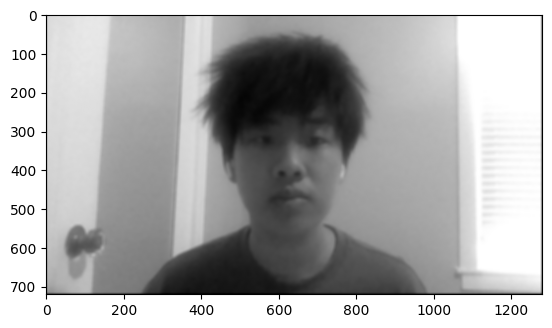

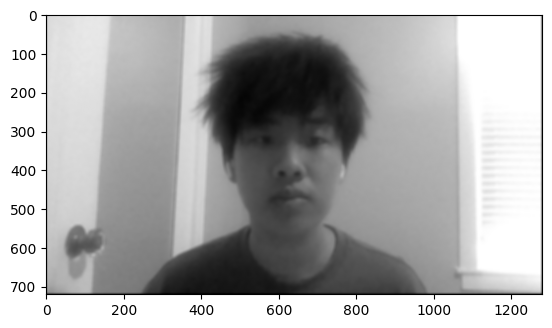

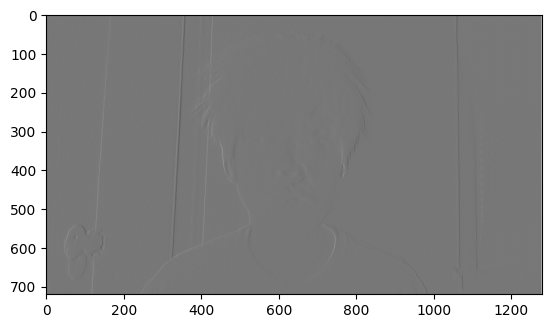

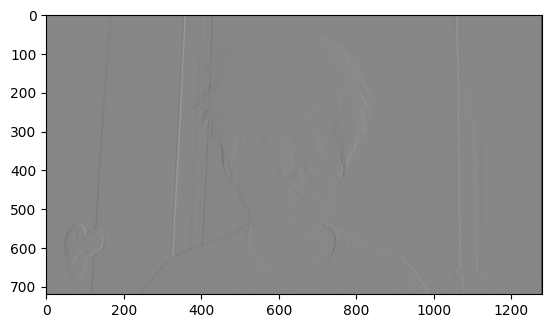

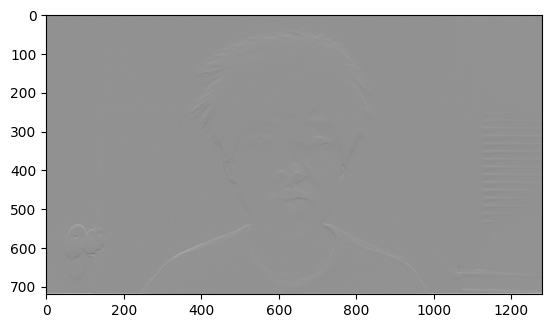

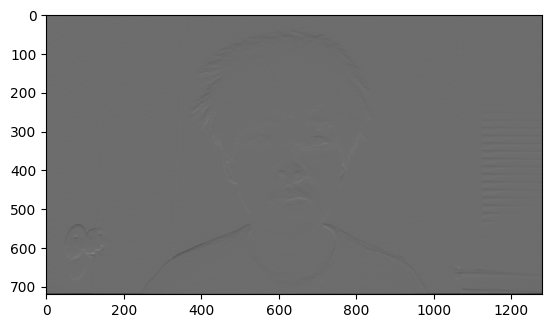

In [67]:
import matplotlib.pyplot as plt
plt.imshow(boxFilterImg_2loop, cmap='gray')
plt.show()
plt.imshow(boxFilterImg, cmap='gray')
plt.show()
plt.imshow(dxImg_2loop, cmap='gray')
plt.show()
plt.imshow(dxImg_scipy, cmap='gray')
plt.show()
plt.imshow(dyImg_2loop, cmap='gray')
plt.show()
plt.imshow(dyImg_scipy, cmap='gray')
plt.show()

Finite Difference Operator

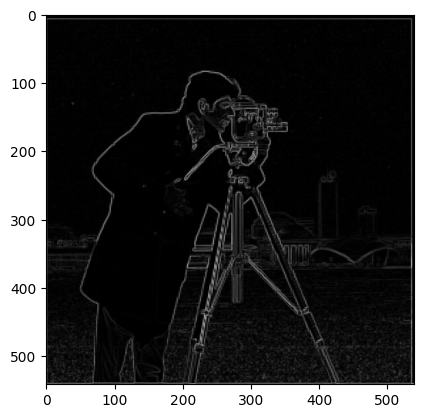

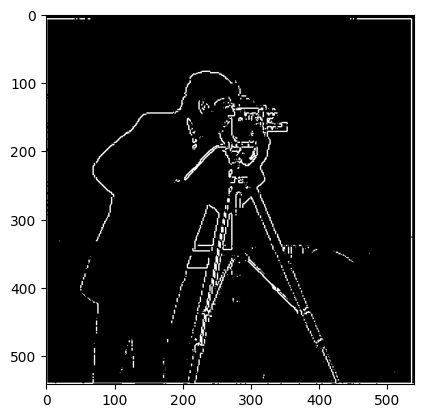

In [68]:
img = cv2.imread("./imgs/cameraman.png")
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

dxImg = signal.convolve2d(img, dxFilter, mode='same', boundary='fill', fillvalue=0)
cv2.imwrite("./results/cameraman_dx.jpg", cv2.normalize(dxImg, None, 0, 255, cv2.NORM_MINMAX))
dyImg = signal.convolve2d(img, dyFilter, mode='same', boundary='fill', fillvalue=0)
cv2.imwrite("./results/cameraman_dy.jpg", cv2.normalize(dyImg, None, 0, 255, cv2.NORM_MINMAX))

gradient_magnitude = np.sqrt(dxImg**2 + dyImg**2)
gradient_magnitude = cv2.normalize(gradient_magnitude, None, 0, 255, cv2.NORM_MINMAX)

edge_threshold = 65
_, edge = cv2.threshold(gradient_magnitude, edge_threshold, 255, cv2.THRESH_BINARY)

cv2.imwrite("./results/cameraman_edge.jpg", edge)
plt.imshow(gradient_magnitude, cmap='gray')
plt.show()
plt.imshow(edge, cmap='gray')
plt.show()

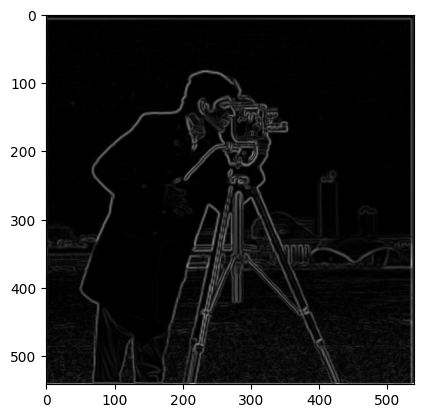

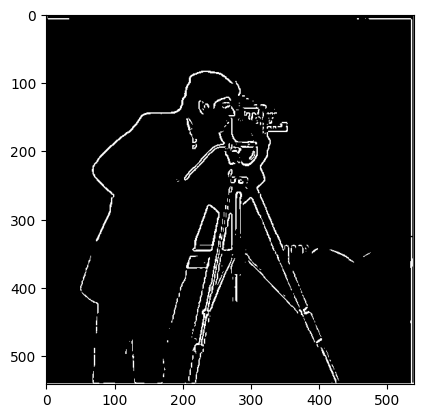

In [69]:
gaussian_kernel = cv2.getGaussianKernel(ksize=5, sigma=1)
gaussian_kernel = gaussian_kernel @ gaussian_kernel.T

blurred_img = signal.convolve2d(img, gaussian_kernel, mode='same', boundary='fill', fillvalue=0)

dxImg = signal.convolve2d(blurred_img, dxFilter, mode='same', boundary='fill', fillvalue=0)
dyImg = signal.convolve2d(blurred_img, dyFilter, mode='same', boundary='fill', fillvalue=0)

gradient_magnitude = np.sqrt(dxImg**2 + dyImg**2)
gradient_magnitude = cv2.normalize(gradient_magnitude, None, 0, 255, cv2.NORM_MINMAX)

edge_threshold = 65
_, edge = cv2.threshold(gradient_magnitude, edge_threshold, 255, cv2.THRESH_BINARY)

cv2.imwrite("./results/cameraman_edge_blurred.jpg", edge)
plt.imshow(gradient_magnitude, cmap='gray')
plt.show()
plt.imshow(edge, cmap='gray')
plt.show()


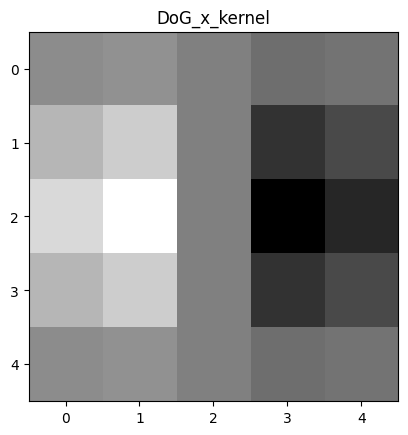

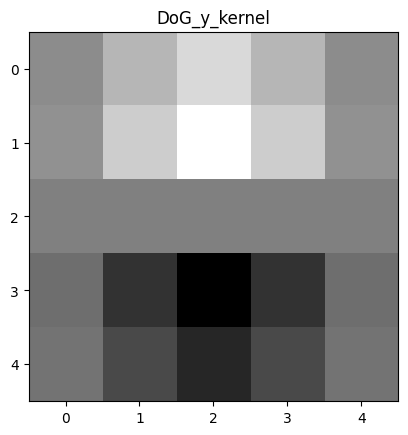

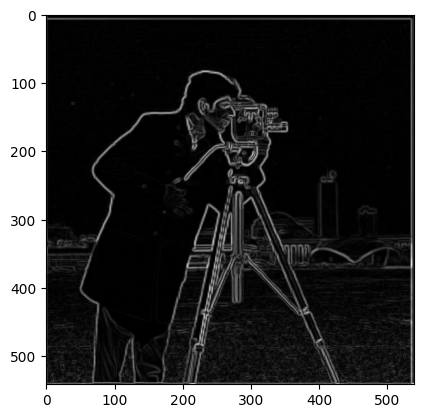

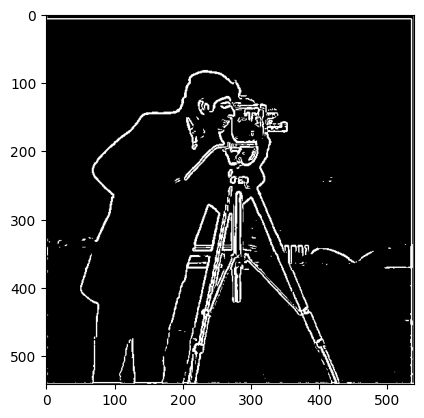

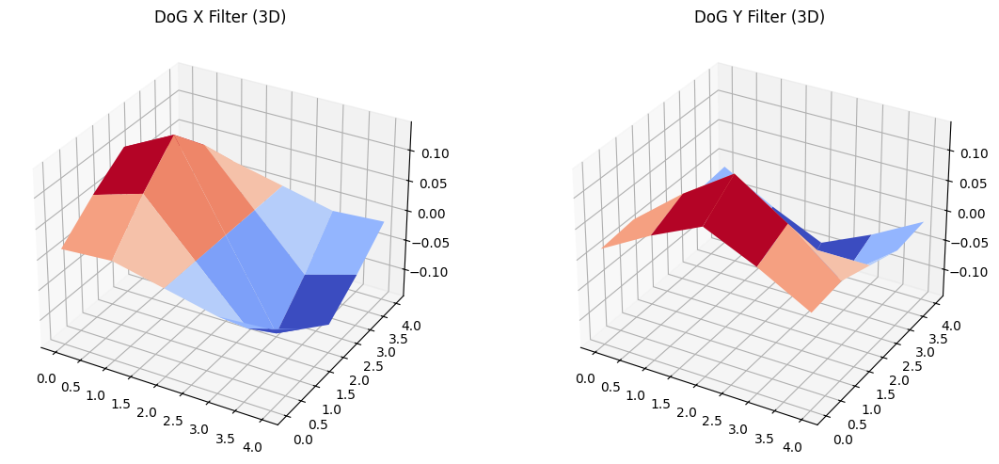

In [70]:
# DoG filter

gaussian_kernel = cv2.getGaussianKernel(ksize=5, sigma=1)
gaussian_kernel = gaussian_kernel @ gaussian_kernel.T

DoG_x_kernel = signal.convolve2d(gaussian_kernel, dxFilter, mode='same', boundary='fill', fillvalue=0)
DoG_y_kernel = signal.convolve2d(gaussian_kernel, dyFilter, mode='same', boundary='fill', fillvalue=0)

plt.imshow(DoG_x_kernel, cmap='gray')
plt.title("DoG_x_kernel")
plt.show()
plt.imsave("./results/DoG_x_kernel.jpg", DoG_x_kernel, cmap='gray')
plt.imshow(DoG_y_kernel, cmap='gray')
plt.title("DoG_y_kernel")
plt.imsave("./results/DoG_y_kernel.jpg", DoG_y_kernel, cmap='gray')
plt.show()

grad_x = signal.convolve2d(img, DoG_x_kernel, mode='same', boundary='fill', fillvalue=0)
grad_y = signal.convolve2d(img, DoG_y_kernel, mode='same', boundary='fill', fillvalue=0)
DoG_img = np.sqrt(grad_x**2 + grad_y**2)
DoG_img = cv2.normalize(DoG_img, None, 0, 255, cv2.NORM_MINMAX)
plt.imshow(DoG_img, cmap='gray')
plt.show()

edge_DoG = cv2.threshold(DoG_img, 65, 255, cv2.THRESH_BINARY)[1]
cv2.imwrite("./results/cameraman_edge_DoG.jpg", edge_DoG)
plt.imshow(edge_DoG, cmap='gray')
plt.show()

from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12, 5))

ax1 = fig.add_subplot(121, projection='3d')
x, y = np.meshgrid(range(DoG_x_kernel.shape[1]), range(DoG_x_kernel.shape[0]))
ax1.plot_surface(x, y, DoG_x_kernel, cmap='coolwarm')
ax1.set_title('DoG X Filter (3D)')

ax2 = fig.add_subplot(122, projection='3d')
x, y = np.meshgrid(range(DoG_y_kernel.shape[1]), range(DoG_y_kernel.shape[0]))
ax2.plot_surface(x, y, DoG_y_kernel, cmap='coolwarm')
ax2.set_title('DoG Y Filter (3D)')

plt.tight_layout()
plt.savefig('./results/DoG_filters_3D.png')
plt.show()


Gradiant orientation

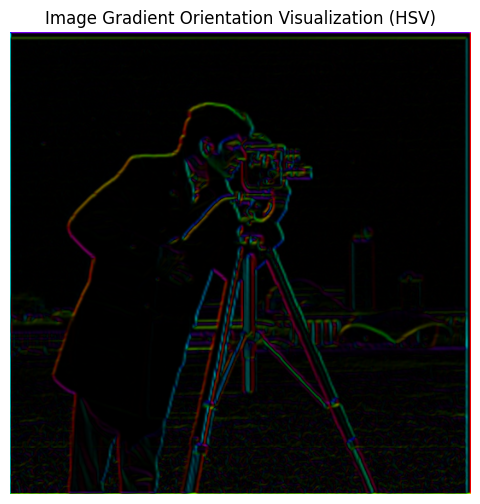

In [71]:

orientation = np.arctan2(dyImg, dxImg)

hue = (orientation + np.pi) / (2 * np.pi)

saturation = np.ones_like(hue)

value = cv2.normalize(gradient_magnitude, None, 0, 1, cv2.NORM_MINMAX)

hsv_image = np.stack([hue, saturation, value], axis=-1)

from matplotlib.colors import hsv_to_rgb
rgb_image = hsv_to_rgb(hsv_image)

plt.figure(figsize=(8, 6))
plt.imshow(rgb_image)
plt.axis('off')
plt.title('Image Gradient Orientation Visualization (HSV)')
plt.show()
plt.imsave('./results/gradient_orientation.png', rgb_image)

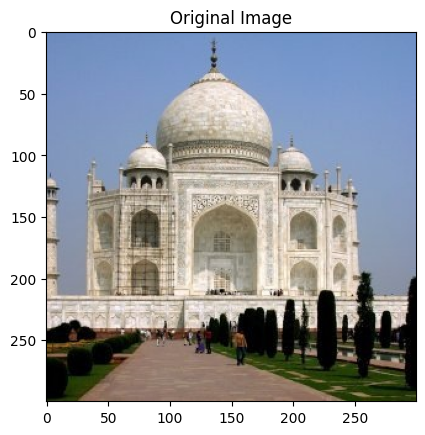

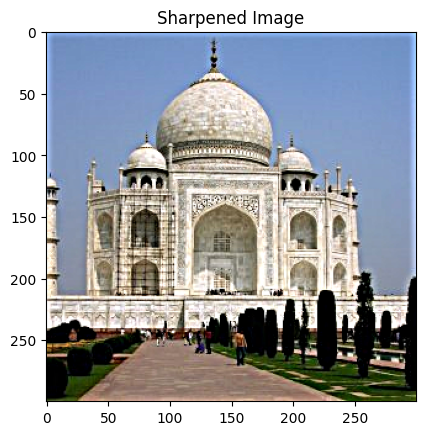

In [72]:
# Image "Sharpening"

img = cv2.imread("./imgs/taj.jpg")

gaussian_kernel = cv2.getGaussianKernel(ksize=13, sigma=4)
gaussian_kernel = gaussian_kernel @ gaussian_kernel.T

kernel = np.zeros((13, 13), dtype=np.float32)
kernel[6, 6] = 2.0
kernel -= gaussian_kernel

def sharpen_img(img):
    sharpened_img = np.zeros_like(img, dtype=np.float32)
    for c in range(img.shape[2]):
        sharpened_img[:, :, c] = signal.convolve2d(img[:, :, c], kernel, mode='same', boundary='fill', fillvalue=0)
    sharpened_img = np.clip(sharpened_img, 0, 255).astype(np.uint8)
    return sharpened_img

sharpened_img = sharpen_img(img)
cv2.imwrite("./results/taj_sharpened.jpg", sharpened_img)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.show()
plt.imshow(cv2.cvtColor(sharpened_img, cv2.COLOR_BGR2RGB))
plt.title("Sharpened Image")
plt.show()

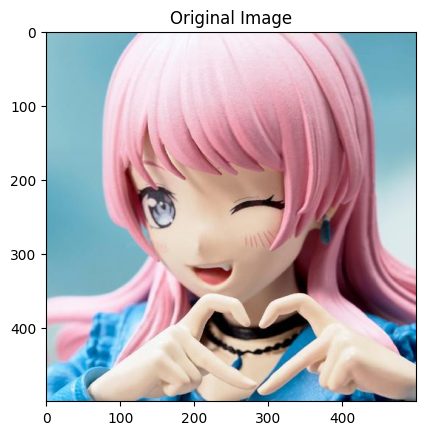

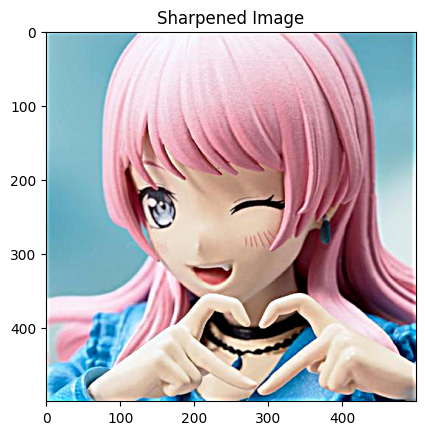

In [73]:
img = cv2.imread("./imgs/Chihaya Anon.png")

sharpened_img = sharpen_img(img)

cv2.imwrite("./results/Chihaya_Anon_sharpened.jpg", sharpened_img)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.show()
plt.imshow(cv2.cvtColor(sharpened_img, cv2.COLOR_BGR2RGB))
plt.title("Sharpened Image")
plt.show()

In [74]:
def hybrid_image(img1, img2):

    gaussian_kernel = cv2.getGaussianKernel(ksize=29, sigma=9)
    gaussian_kernel = gaussian_kernel @ gaussian_kernel.T
    sharpen_kernel = np.zeros_like(gaussian_kernel)
    sharpen_kernel[sharpen_kernel.shape[0] // 2, sharpen_kernel.shape[1] // 2] = 1.0
    sharpen_kernel -= gaussian_kernel

    gaussian_kernel = cv2.getGaussianKernel(ksize=25, sigma=8)
    gaussian_kernel = gaussian_kernel @ gaussian_kernel.T

    def conv(img, kernel):
        output = np.zeros_like(img, dtype=np.float32)
        for c in range(img.shape[2]):
            output[:, :, c] = signal.convolve2d(img[:, :, c], kernel, mode='same', boundary='fill', fillvalue=0)
        # output[:, :] = signal.convolve2d(img[:, :], kernel, mode='same', boundary='fill', fillvalue=0)
        output = cv2.normalize(output, None, 0, 255, cv2.NORM_MINMAX)
        return output

    img1 = conv(img1, gaussian_kernel)
    img2 = conv(img2, sharpen_kernel)
    result = img1 + img2
    result = cv2.normalize(result, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    img1 = np.astype(img1, np.uint8)
    img2 = np.astype(img2, np.uint8)
    return img1, img2, result

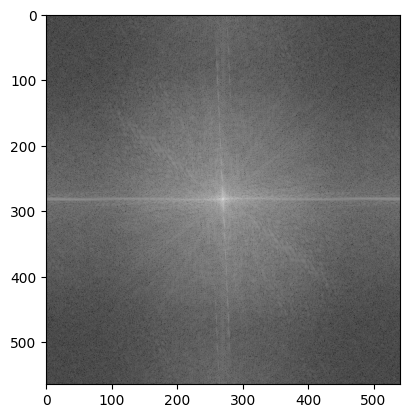

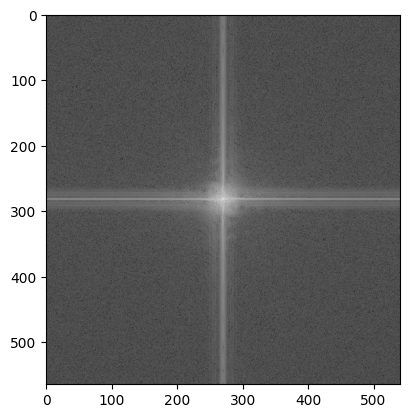

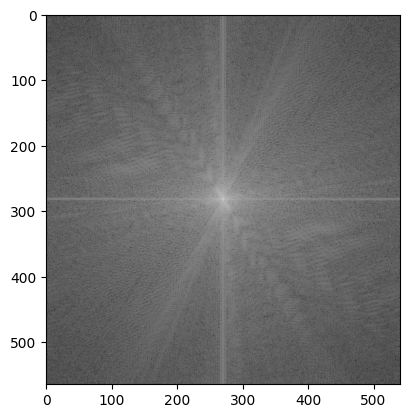

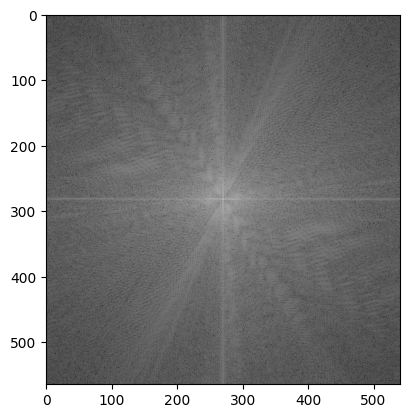

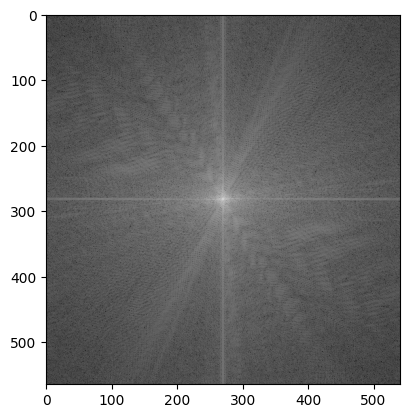

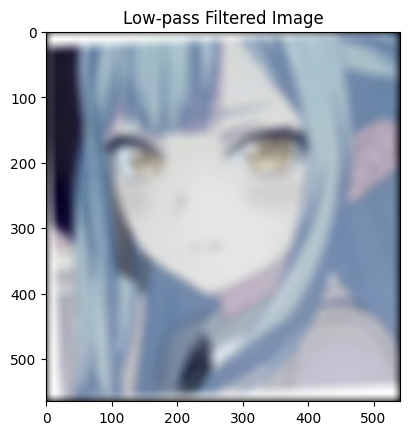

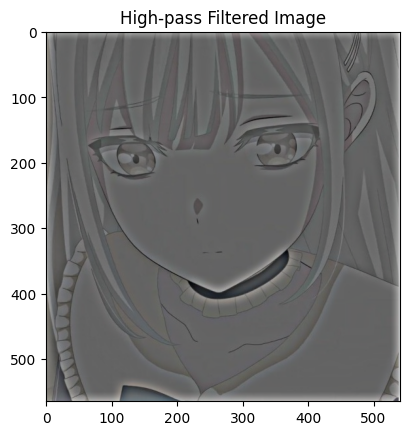

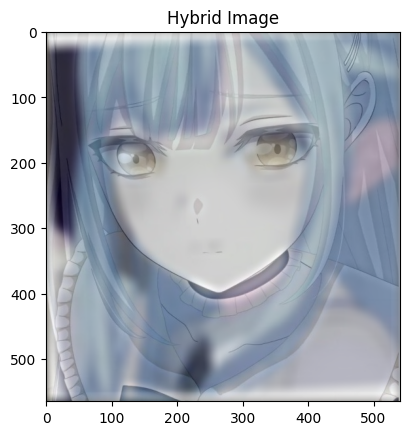

In [75]:
img1 = cv2.imread("./imgs/Sakiko.jpg")
img2 = cv2.imread("./imgs/Mutsumi.jpg")
Img1, Img2, result = hybrid_image(img1, img2)

plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY))))), cmap='gray')
plt.imsave("./results/fft1.jpg", np.log(np.abs(np.fft.fftshift(np.fft.fft2(cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY))))))
plt.show()
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(cv2.cvtColor(Img1, cv2.COLOR_BGR2GRAY))))), cmap='gray')
plt.imsave("./results/fft1_filtered.jpg", np.log(np.abs(np.fft.fftshift(np.fft.fft2(cv2.cvtColor(Img1, cv2.COLOR_BGR2GRAY))))))
plt.show()
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY))))), cmap='gray')
plt.imsave("./results/fft2.jpg", np.log(np.abs(np.fft.fftshift(np.fft.fft2(cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY))))))
plt.show()
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(cv2.cvtColor(Img2, cv2.COLOR_BGR2GRAY))))), cmap='gray')
plt.imsave("./results/fft2_filtered.jpg", np.log(np.abs(np.fft.fftshift(np.fft.fft2(cv2.cvtColor(Img2, cv2.COLOR_BGR2GRAY))))))
plt.show()
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(cv2.cvtColor(result, cv2.COLOR_BGR2GRAY))))), cmap='gray')
plt.imsave("./results/fft_result.jpg", np.log(np.abs(np.fft.fftshift(np.fft.fft2(cv2.cvtColor(result, cv2.COLOR_BGR2GRAY))))))
plt.show()

# plt.imshow(img1, cmap='gray')
plt.imshow(cv2.cvtColor(Img1, cv2.COLOR_BGR2RGB))
plt.title("Low-pass Filtered Image")
plt.show()
plt.imsave("./results/filtered1_sakiko.jpg", cv2.cvtColor(Img1, cv2.COLOR_BGR2RGB))
# plt.imshow(img2, cmap='gray')
plt.imshow(cv2.cvtColor(Img2, cv2.COLOR_BGR2RGB))
plt.title("High-pass Filtered Image")
plt.show()
plt.imsave("./results/filtered2_mutsumi.jpg", cv2.cvtColor(Img2, cv2.COLOR_BGR2RGB))

# plt.imshow(result, cmap='gray')
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.title("Hybrid Image")
plt.show()
plt.imsave("./results/hybrid_sakiko_mutsumi.jpg", cv2.cvtColor(result, cv2.COLOR_BGR2RGB))

# cv2.imshow("Sakiko (Low-pass)", img1)
# cv2.imshow("Mutsumi (High-pass)", img2)
# cv2.imshow("Hybrid Image", result)
# cv2.waitKey(0)

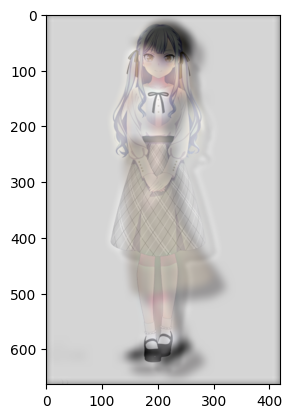

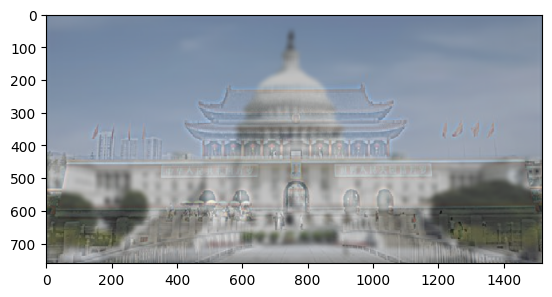

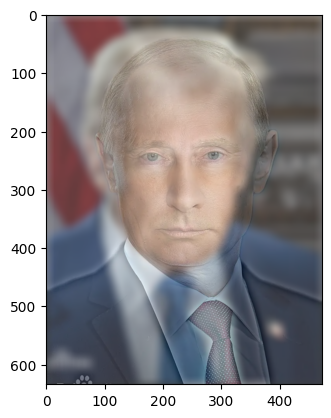

True

In [76]:
img1 = cv2.imread("./imgs/Misumi.png")
img2 = cv2.imread("./imgs/Sakiko.png")

img2 = cv2.resize(img2, (img1.shape[1], img1.shape[0]))
# cv2.imwrite("./imgs/Misumi.png", img2)

Img1, Img2, result = hybrid_image(img1, img2)

plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.show()
cv2.imwrite("./results/original_misumi.png", img1)
cv2.imwrite("./results/original_sakiko.png", img2)
cv2.imwrite("./results/hybird_sakiko_misumi.png", result)


img1 = cv2.imread("./imgs/whitehouse.png")
img2 = cv2.imread("./imgs/tiananmen.png")

Img1, Img2, result = hybrid_image(img1, img2)

plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.show()
cv2.imwrite("./results/original_whitehouse.png", img1)
cv2.imwrite("./results/original_tiananmen.png", img2)
cv2.imwrite("./results/hybird_whitehouse_tiananmen.png", result)

img1 = cv2.imread("./imgs/Trump.png")
img2 = cv2.imread("./imgs/Putin.png")

Img1, Img2, result = hybrid_image(img1, img2)

plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.show()
cv2.imwrite("./results/original_trump.png", img1)
cv2.imwrite("./results/original_putin.png", img2)
cv2.imwrite("./results/hybird_trump_putin.png", result)

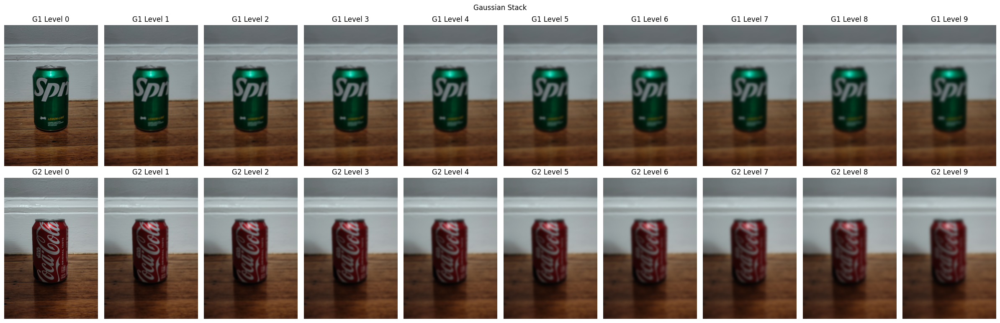

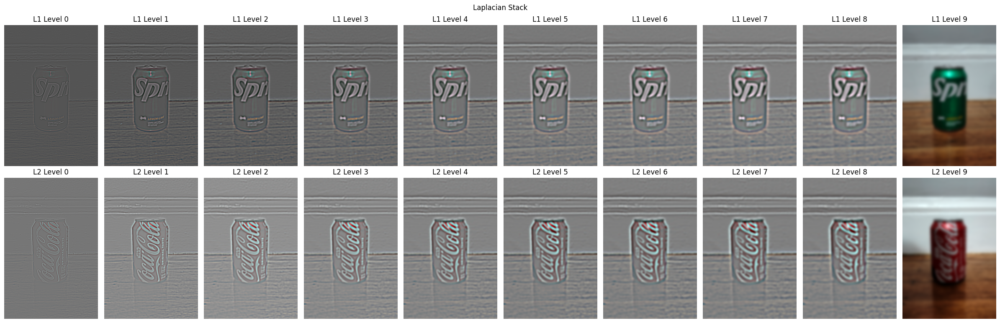

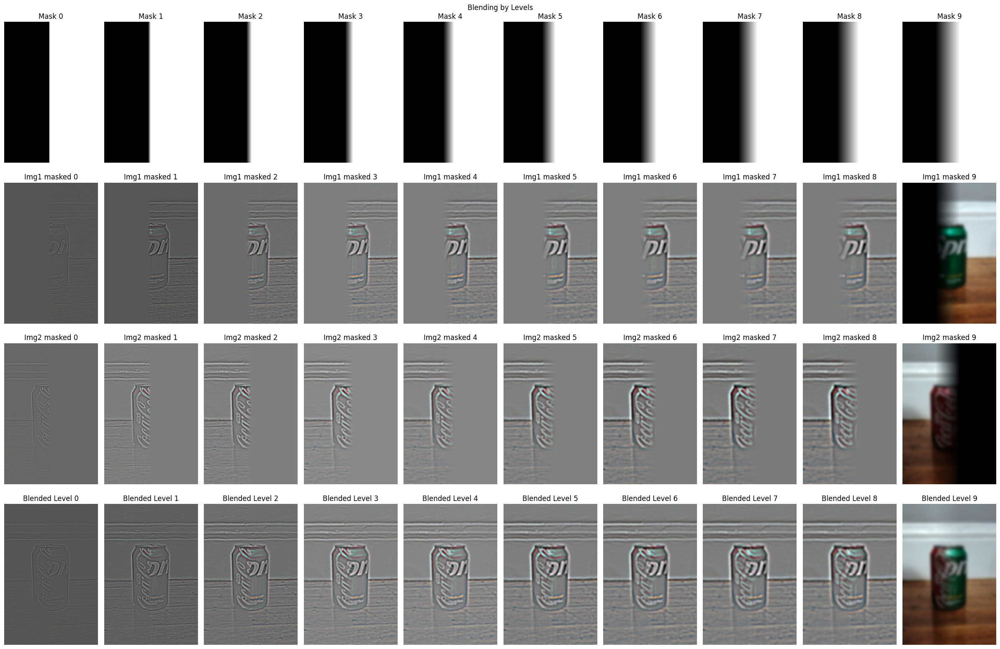

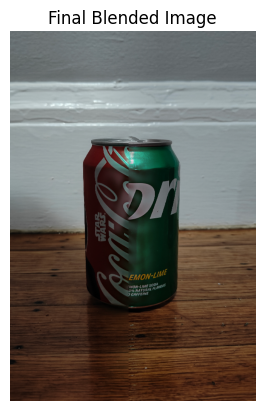

In [77]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def gaussian_stack(img, num_levels=10, kernel_size=11, sigma=3):
    img = img.astype(np.float32)
    g_stack = [img]
    gaussian_kernel = cv2.getGaussianKernel(kernel_size, sigma)
    gaussian_kernel = gaussian_kernel @ gaussian_kernel.T

    for i in range(1, num_levels):
        blurred = cv2.filter2D(g_stack[-1], -1, gaussian_kernel)
        g_stack.append(blurred)
    return g_stack

def laplacian_stack(g_stack):
    l_stack = []
    for i in range(len(g_stack) - 1):
        lap = g_stack[i] - g_stack[i + 1]
        l_stack.append(lap)
    l_stack.append(g_stack[-1])
    return l_stack

def get_masks(shape, num_levels=8):
    h, w, c = shape
    masks = []
    start = end = w // 2 - 10
    transition = int(w * 0.015)
    for i in range(num_levels):
        mask = np.zeros((h, w, c), dtype=np.float32)
        mask[:, :start, :] = 0
        mask[:, end:, :] = 1
        if end > start:
            gradient = np.linspace(0, 1, end - start)
            mask[:, start:end, :] = gradient[None, :, None]
        masks.append(mask)
        start = max(start - transition, 0)
        end = min(end + transition, w)
    return masks

img1 = cv2.imread('./imgs/sprite.png')
img2 = cv2.imread('./imgs/coke.png')
img1 = cv2.resize(img1, (img1.shape[1]//2, img1.shape[0]//2))
img2 = cv2.resize(img2, (img2.shape[1]//2, img2.shape[0]//2))

g1 = gaussian_stack(img1)
g2 = gaussian_stack(img2)
l1 = laplacian_stack(g1)
l2 = laplacian_stack(g2)

masks = get_masks(img1.shape, num_levels=len(l1))

imgs1 = [l1[i] * masks[i] for i in range(len(l1))]
imgs2 = [l2[i] * (1 - masks[i]) for i in range(len(l2))]
results = [imgs1[i] + imgs2[i] for i in range(len(imgs1))]

result = np.sum(np.array(results), axis=0)
result = np.clip(result, 0, 255).astype(np.uint8)

## 1. Gaussian Stack
fig, axes = plt.subplots(2, len(g1), figsize=(24, 8))
for i in range(len(g1)):
    axes[0, i].imshow(cv2.cvtColor(np.clip(g1[i], 0, 255).astype(np.uint8), cv2.COLOR_BGR2RGB))
    axes[0, i].set_title(f"G1 Level {i}")
    axes[0, i].axis('off')
    axes[1, i].imshow(cv2.cvtColor(np.clip(g2[i], 0, 255).astype(np.uint8), cv2.COLOR_BGR2RGB))
    axes[1, i].set_title(f"G2 Level {i}")
    axes[1, i].axis('off')
plt.suptitle("Gaussian Stack")
plt.tight_layout()
plt.show()

## 2. Laplacian Stack
fig, axes = plt.subplots(2, len(l1), figsize=(24, 8))
for i in range(len(l1)):
    axes[0, i].imshow(cv2.cvtColor(cv2.normalize(l1[i], None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8), cv2.COLOR_BGR2RGB))
    axes[0, i].set_title(f"L1 Level {i}")
    axes[0, i].axis('off')
    axes[1, i].imshow(cv2.cvtColor(cv2.normalize(l2[i], None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8), cv2.COLOR_BGR2RGB))
    axes[1, i].set_title(f"L2 Level {i}")
    axes[1, i].axis('off')
plt.suptitle("Laplacian Stack")
plt.tight_layout()
plt.show()

## 3. Blending Process
fig, axes = plt.subplots(4, len(imgs1), figsize=(24, 16))
for i in range(len(imgs1)):
    axes[0, i].imshow(cv2.cvtColor(cv2.normalize(masks[i]*255, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8), cv2.COLOR_BGR2RGB))
    axes[0, i].set_title(f"Mask {i}")
    axes[0, i].axis('off')
    axes[1, i].imshow(cv2.cvtColor(cv2.normalize(imgs1[i], None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8), cv2.COLOR_BGR2RGB))
    axes[1, i].set_title(f"Img1 masked {i}")
    axes[1, i].axis('off')
    axes[2, i].imshow(cv2.cvtColor(cv2.normalize(imgs2[i], None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8), cv2.COLOR_BGR2RGB))
    axes[2, i].set_title(f"Img2 masked {i}")
    axes[2, i].axis('off')
    axes[3, i].imshow(cv2.cvtColor(cv2.normalize(results[i], None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8), cv2.COLOR_BGR2RGB))
    axes[3, i].set_title(f"Blended Level {i}")
    axes[3, i].axis('off')
plt.suptitle("Blending by Levels")
plt.tight_layout()
plt.show()

## 4. Final Result
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.title("Final Blended Image")
plt.axis('off')
plt.show()
